### U koje doba dana se najvise menjaju stranice na wiki --> I to u srbiji ?

In [0]:
# dbutils.fs.ls("/")
# %fs ls dbfs:/FileStore/real-data/

Out[43]: [FileInfo(path='dbfs:/FileStore/', name='FileStore/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/', name='databricks-datasets/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-results/', name='databricks-results/', size=0, modificationTime=0)]

In [0]:
from pyspark.sql.types import *

inputPath = "dbfs:/FileStore/real-data/data-1.csv"

jsonSchema = StructType([
    StructField("$schema", StringType(), True),
    StructField("meta", StructType([
        StructField("uri", StringType(), True),
        StructField("request_id", StringType(), True),
        StructField("id", StringType(), True),
        StructField("dt", StringType(), True),
        StructField("domain", StringType(), True),
        StructField("stream", StringType(), True),
        StructField("topic", StringType(), True),
        StructField("partition", IntegerType(), True),
        StructField("offset", IntegerType(), True),
    ]), True),
    StructField("id", IntegerType(), True),
    StructField("type", StringType(), True),
    StructField("namespace", IntegerType(), True),
    StructField("title", StringType(), True),
    StructField("title_url", StringType(), True),
    StructField("comment", StringType(), True),
    StructField("timestamp", IntegerType(), True),
    StructField("user", StringType(), True),
    StructField("bot", BooleanType(), True),
    StructField("notify_url", StringType(), True),
    StructField("minor", BooleanType(), True),
    StructField("patrolled", BooleanType(), True),
    StructField("length", StructType([
        StructField("old", IntegerType(), True),
        StructField("new", IntegerType(), True),
    ]), True),
    StructField("revision", StructType([
        StructField("old", IntegerType(), True),
        StructField("new", IntegerType(), True),
    ]), True),
    StructField("server_url", StringType(), True),
    StructField("server_name", StringType(), True),
    StructField("server_script_path", StringType(), True),
    StructField("wiki", StringType(), True),
    StructField("parsedcomment", StringType(), True),
])

df_input = spark.read.schema(jsonSchema).json(inputPath)
# games = spark.read.csv(file_location, encoding="UTF-8", header=True, schema=schema_def) 
# df_input = spark.read.csv(inputPath, encoding="UTF-8", header = False, schema = jsonSchema)
# display(df_input)
df_input.count()

Out[44]: 31391

In [0]:
from pyspark.sql.functions import *      # for window() function

df_input = df_input.filter(col("type") != "142")

staticCountsDF = (df_input.groupBy("type").count())
staticCountsDF.cache()

display(staticCountsDF)
# treba izbaciti ovo type: "142" i type: "null" 

type,count
new,826
log,1846
edit,18456
categorize,10260


In [0]:
display(df_input)

$schema,meta,id,type,namespace,title,title_url,comment,timestamp,user,bot,notify_url,minor,patrolled,length,revision,server_url,server_name,server_script_path,wiki,parsedcomment
/mediawiki/recentchange/1.0.0,"List(https://www.wikidata.org/wiki/Q239726, 6bc154f3-69bd-4230-a6fd-b14ac937cd21, 03a2c553-5a51-43e7-8787-c47bd33a3915, 2024-01-21T22:29:55Z, www.wikidata.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409435)",2121948525,edit,0,Q239726,https://www.wikidata.org/wiki/Q239726,"/* wbremoveclaims-remove:1| */ [[Property:P452]]: [[Q112166113]], [[:toollabs:quickstatements/#/batch/222100|batch #222100]]",1705876195,Arpyia,false,https://www.wikidata.org/w/index.php?diff=2059212194&oldid=2053288871&rcid=2121948525,false,true,"List(65842, 64185)","List(2053288871, 2059212194)",https://www.wikidata.org,www.wikidata.org,/w,wikidatawiki,"‎Déclaration retirée : secteur d'activité économique (P452): administration publique générale (Q112166113), batch #222100"
/mediawiki/recentchange/1.0.0,"List(https://la.wikipedia.org/wiki/Categoria:Mortui_1816, 0bda42a7-0977-42ba-8933-6b5f23d8031e, cee29d28-7146-4f97-958b-45c52f47e058, 2024-01-21T22:29:52Z, la.wikipedia.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409436)",13783966,categorize,14,Categoria:Mortui 1816,https://la.wikipedia.org/wiki/Categoria:Mortui_1816,[[:Vladislaus Ozerov]] added to category,1705876192,Demetrius Talpa,false,https://la.wikipedia.org/w/index.php?diff=3812688&oldid=0,null,null,null,null,https://la.wikipedia.org,la.wikipedia.org,/w,lawiki,Vladislaus Ozerov added to category
/mediawiki/recentchange/1.0.0,"List(https://www.wikidata.org/wiki/Q77253138, 00ab8aba-fd1a-4090-8e42-239cbf39a27e, c5de36e0-7227-491a-8776-3f0c0630a090, 2024-01-21T22:29:55Z, www.wikidata.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409437)",2121948527,edit,0,Q77253138,https://www.wikidata.org/wiki/Q77253138,"/* wbeditentity-update-languages-short:0||af, co, cy, da, de-at, de-ch, en-ca, en-gb, en-us, et, fi, frp, fur */ BOT - Adding labels (13 languages): af, co, cy, da, de-at, de-ch, en-ca, en-gb, en-us, et, fi, frp, fur",1705876195,Emijrpbot,true,https://www.wikidata.org/w/index.php?diff=2059212198&oldid=1703950239&rcid=2121948527,false,true,"List(16447, 17443)","List(1703950239, 2059212198)",https://www.wikidata.org,www.wikidata.org,/w,wikidatawiki,"‎Changed label, description and/or aliases in af, co, cy, da, de-at, de-ch, en-ca, en-gb, en-us, et, fi, frp, fur: BOT - Adding labels (13 languages): af, co, cy, da, de-at, de-ch, en-ca, en-gb, en-us, et, fi, frp, fur"
/mediawiki/recentchange/1.0.0,"List(https://la.wikipedia.org/wiki/Categoria:Auctores_Russici, 0bda42a7-0977-42ba-8933-6b5f23d8031e, b23d2b24-048a-42bd-b478-9538464a7d85, 2024-01-21T22:29:52Z, la.wikipedia.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409438)",13783967,categorize,14,Categoria:Auctores Russici,https://la.wikipedia.org/wiki/Categoria:Auctores_Russici,[[:Vladislaus Ozerov]] added to category,1705876192,Demetrius Talpa,false,https://la.wikipedia.org/w/index.php?diff=3812688&oldid=0,null,null,null,null,https://la.wikipedia.org,la.wikipedia.org,/w,lawiki,Vladislaus Ozerov added to category
/mediawiki/recentchange/1.0.0,"List(https://www.wikidata.org/wiki/Q36910000, 7d5f36b9-7c06-4e0e-8d7c-6314ada074a2, a4470e71-1044-4881-a3bb-0a4ce2d69281, 2024-01-21T22:29:55Z, www.wikidata.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409439)",2121948526,edit,0,Q36910000,https://www.wikidata.org/wiki/Q36910000,"/* wbsetqualifier-add:1| */ [[Property:P898]]: ɡavdɛn, #quickstatements; #temporary_batch_1705874558580",1705876195,Nikki,false,https://www.wikidata.org/w/index.php?diff=2059212197&oldid=1975390086&rcid=2121948526,false,true,"List(48564, 48845)","List(1975390086, 2059212197)",https://www.wikidata.org,www.wikidata.org,/w,wikidatawiki,"‎Added qualifier: IPA transcription (P898): ɡavdɛn, #quickstatements; #temporary_batch_1705874558580"
/mediaw

In [0]:
result = df_input.select("*").groupBy("user").agg(
    count("user").alias("change_count")
).sort(col("change_count").desc())

result.show()
# users = df_input.select(*)

# result_2 = games_df_new.select("*").groupBy("NOC", "Games", "Medal").agg(count("Medal").alias("Medal_Count")).cache()

# display(users)

+--------------+------------+
|          user|change_count|
+--------------+------------+
|        Cewbot|        2545|
|   GeographBot|        1627|
|   Dcirovicbot|        1543|
| SchlurcherBot|        1322|
|      Renamerr|        1299|
|     Balyozbot|        1173|
|     Emijrpbot|         799|
|     NacaruBot|         744|
|       ԱշոտՏՆՂ|         584|
|       QBA-bot|         392|
|BotMultichillT|         370|
| Plaça de Maig|         370|
|       Wmr-bot|         319|
|         Remux|         318|
|      JiyanBot|         256|
|      ԱշբոտՏՆՂ|         249|
|       Horcrux|         234|
|   Dinkun Chen|         215|
|    Bot-Jagwar|         196|
|      Chenspec|         170|
+--------------+------------+
only showing top 20 rows



In [0]:
df_with_date_time = df_input.withColumn("datetime", from_unixtime(col("timestamp")).cast("timestamp"))

df_with_date_time = df_with_date_time.withColumn("hour", date_format(col("datetime"), "HH"))
# date_format(col("Input"), "MM-dd-yyyy").as("format") 
display(df_with_date_time)

# I want to group it by hours so I can visualize it and see when does the most changes happen
df_hour_count = df_with_date_time.select("*").groupBy("hour").agg(
    count("hour").alias("hour_count")
)
df_hour_count.show()

$schema,meta,id,type,namespace,title,title_url,comment,timestamp,user,bot,notify_url,minor,patrolled,length,revision,server_url,server_name,server_script_path,wiki,parsedcomment,datetime,hour
/mediawiki/recentchange/1.0.0,"List(https://www.wikidata.org/wiki/Q239726, 6bc154f3-69bd-4230-a6fd-b14ac937cd21, 03a2c553-5a51-43e7-8787-c47bd33a3915, 2024-01-21T22:29:55Z, www.wikidata.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409435)",2121948525,edit,0,Q239726,https://www.wikidata.org/wiki/Q239726,"/* wbremoveclaims-remove:1| */ [[Property:P452]]: [[Q112166113]], [[:toollabs:quickstatements/#/batch/222100|batch #222100]]",1705876195,Arpyia,false,https://www.wikidata.org/w/index.php?diff=2059212194&oldid=2053288871&rcid=2121948525,false,true,"List(65842, 64185)","List(2053288871, 2059212194)",https://www.wikidata.org,www.wikidata.org,/w,wikidatawiki,"‎Déclaration retirée : secteur d'activité économique (P452): administration publique générale (Q112166113), batch #222100",2024-01-21T22:29:55.000+0000,22
/mediawiki/recentchange/1.0.0,"List(https://la.wikipedia.org/wiki/Categoria:Mortui_1816, 0bda42a7-0977-42ba-8933-6b5f23d8031e, cee29d28-7146-4f97-958b-45c52f47e058, 2024-01-21T22:29:52Z, la.wikipedia.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409436)",13783966,categorize,14,Categoria:Mortui 1816,https://la.wikipedia.org/wiki/Categoria:Mortui_1816,[[:Vladislaus Ozerov]] added to category,1705876192,Demetrius Talpa,false,https://la.wikipedia.org/w/index.php?diff=3812688&oldid=0,null,null,null,null,https://la.wikipedia.org,la.wikipedia.org,/w,lawiki,Vladislaus Ozerov added to category,2024-01-21T22:29:52.000+0000,22
/mediawiki/recentchange/1.0.0,"List(https://www.wikidata.org/wiki/Q77253138, 00ab8aba-fd1a-4090-8e42-239cbf39a27e, c5de36e0-7227-491a-8776-3f0c0630a090, 2024-01-21T22:29:55Z, www.wikidata.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409437)",2121948527,edit,0,Q77253138,https://www.wikidata.org/wiki/Q77253138,"/* wbeditentity-update-languages-short:0||af, co, cy, da, de-at, de-ch, en-ca, en-gb, en-us, et, fi, frp, fur */ BOT - Adding labels (13 languages): af, co, cy, da, de-at, de-ch, en-ca, en-gb, en-us, et, fi, frp, fur",1705876195,Emijrpbot,true,https://www.wikidata.org/w/index.php?diff=2059212198&oldid=1703950239&rcid=2121948527,false,true,"List(16447, 17443)","List(1703950239, 2059212198)",https://www.wikidata.org,www.wikidata.org,/w,wikidatawiki,"‎Changed label, description and/or aliases in af, co, cy, da, de-at, de-ch, en-ca, en-gb, en-us, et, fi, frp, fur: BOT - Adding labels (13 languages): af, co, cy, da, de-at, de-ch, en-ca, en-gb, en-us, et, fi, frp, fur",2024-01-21T22:29:55.000+0000,22
/mediawiki/recentchange/1.0.0,"List(https://la.wikipedia.org/wiki/Categoria:Auctores_Russici, 0bda42a7-0977-42ba-8933-6b5f23d8031e, b23d2b24-048a-42bd-b478-9538464a7d85, 2024-01-21T22:29:52Z, la.wikipedia.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409438)",13783967,categorize,14,Categoria:Auctores Russici,https://la.wikipedia.org/wiki/Categoria:Auctores_Russici,[[:Vladislaus Ozerov]] added to category,1705876192,Demetrius Talpa,false,https://la.wikipedia.org/w/index.php?diff=3812688&oldid=0,null,null,null,null,https://la.wikipedia.org,la.wikipedia.org,/w,lawiki,Vladislaus Ozerov added to category,2024-01-21T22:29:52.000+0000,22
/mediawiki/recentchange/1.0.0,"List(https://www.wikidata.org/wiki/Q36910000, 7d5f36b9-7c06-4e0e-8d7c-6314ada074a2, a4470e71-1044-4881-a3bb-0a4ce2d69281, 2024-01-21T22:29:55Z, www.wikidata.org, mediawiki.recentchange, codfw.mediawiki.recentchange, 0, 951409439)",2121948526,edit,0,Q36910000,https://www.wikidata.org/wiki/Q36910000,"/* wbsetqualifier-add:1| */ [[Property:P898]]: ɡavdɛn, #quickstatements; #temporary_batch_1705874558580",1705876195,Nikki,false,https://www.wikidata.org/w/index.php?diff=2059212197&oldid=1975390086&rcid=2121948526,false,true,"List(48564, 48845)","List(1975390086, 2059212197)",https://www.wikidata.org,w

+----+----------+
|hour|hour_count|
+----+----------+
|  22|      3086|
|  12|     10061|
|  13|      2114|
|  14|      8547|
|  15|      7580|
+----+----------+



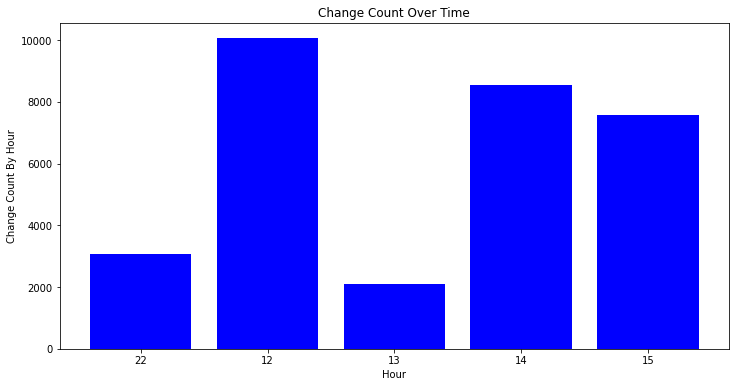

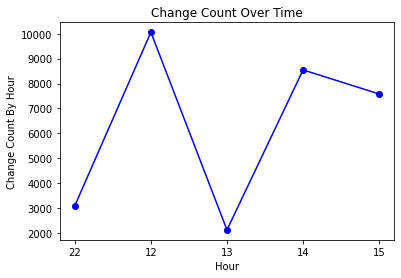

In [0]:
import matplotlib.pyplot as plt

# Convert PySpark DataFrame to Pandas DataFrame for plotting
pd_hour_count = df_hour_count.toPandas()

# Plotting the changes over time
plt.figure(figsize=(12, 6))
plt.bar(pd_hour_count["hour"], pd_hour_count["hour_count"], color="blue")
plt.xlabel("Hour")
plt.ylabel("Change Count By Hour")
plt.title("Change Count Over Time")
plt.show()

# Plot a line graph using matplotlib
plt.plot(pd_hour_count['hour'], pd_hour_count['hour_count'], marker='o', linestyle='-', color='b')
plt.xlabel('Hour')
plt.ylabel('Change Count By Hour')
plt.title('Change Count Over Time')
plt.show()